# Blood Cell Classification using MobileNetV2 with CBAM

This notebook implements a comprehensive solution for classifying blood cells for Acute Lymphoblastic Leukemia (ALL) detection using:

1. **MobileNetV2 Baseline**: Efficient mobile-optimized architecture
2. **MobileNetV2 + CBAM**: Enhanced with Convolutional Block Attention Module

## Classes
- **Benign**: Healthy blood cells
- **EarlyPreB**: Early Pre-B cell malignancy
- **PreB**: Pre-B cell malignancy  
- **ProB**: Pro-B cell malignancy

## 1. Import Libraries and Setup

Import all necessary libraries and set up the environment for reproducible results.

In [11]:
# Standard libraries
import os
import sys
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import warnings
from sklearn.model_selection import train_test_split

# Deep learning libraries
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, LearningRateScheduler

# Set random seeds for reproducibility
np.random.seed(88)
random.seed(88)
tf.random.set_seed(88)

# Suppress warnings
warnings.filterwarnings('ignore')
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

# Add src directory to Python path
sys.path.append('./src')

# Import custom modules
from data_preprocessing import (
    create_temp_folders, prepare_data_splits, process_and_save_test_data,
    process_and_save_train_data_with_segmentation, create_dataframes, create_data_generators
)
from models import (
    create_mobilenetv2_baseline, create_simple_mobilenetv2_cbam,
    compile_model, create_lr_schedule
)
from training_utils import (
    train_model, plot_training_history, evaluate_model, plot_confusion_matrix,
    print_classification_report, plot_sample_predictions, save_model_and_results,
    compare_models
)

from visualize import (
    comprehensive_parameter_analysis, find_optimal_clusters,
    find_optimal_threshold, test_morphological_parameters,
    segment_blood_cell
)

print("Libraries imported successfully!")
print(f"TensorFlow version: {tf.__version__}")
print(f"GPU Available: {tf.config.list_physical_devices('GPU')}")

Libraries imported successfully!
TensorFlow version: 2.10.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


## 2. Configuration and Hyperparameters

Define all configuration parameters and hyperparameters in one place for easy modification.

In [2]:
# Configuration
CONFIG = {
    # Data paths
    'data_dir': 'data/Blood cell Cancer [ALL]',
    'temp_data_dir': 'data/tmp',
    'results_dir': 'results',
    'models_dir': 'models',
    
    # Data parameters
    'img_size': (224, 224),
    'img_shape': (224, 224, 3),
    'batch_size': 32,
    'train_split': 0.90,  # 90% for training, 10% for testing
    'val_split': 0.80,    # 80% of training for train, 20% for validation
    
    # Training parameters
    'epochs': 50,
    'initial_lr': 1e-3,
    'lr_decay_steps': 40,
    'lr_decay_rate': 0.96,
    'dropout_rate': 0.3,
    
    # Model parameters
    'num_classes': 4,
    'class_names': ['EarlyPreB', 'PreB', 'ProB', 'benign'],
    
    # Other settings
    'random_seed': 42,
    'verbose': 1
}

# Create necessary directories
for directory in [CONFIG['results_dir'], CONFIG['temp_data_dir'], CONFIG['models_dir']]:
    os.makedirs(directory, exist_ok=True)
    print(f"✅ Directory ready: {directory}/")

print("\nConfiguration set successfully!")
print(f"Working directory: {os.getcwd()}")
print(f"Data directory: {CONFIG['data_dir']}")

✅ Directory ready: results/
✅ Directory ready: data/tmp/
✅ Directory ready: models/

Configuration set successfully!
Working directory: d:\Projects\Bu Lina\Blood Cell (ALL)
Data directory: data/Blood cell Cancer [ALL]


## 3. Data Exploration

Explore the dataset structure and visualize class distribution.

Data directory found: data/Blood cell Cancer [ALL]

Subdirectories found: ['Benign', '[Malignant] early Pre-B', '[Malignant] Pre-B', '[Malignant] Pro-B']

Total samples in dataset: 3242

Samples per class:
  Benign: 512 samples
  [Malignant] early Pre-B: 979 samples
  [Malignant] Pre-B: 955 samples
  [Malignant] Pro-B: 796 samples


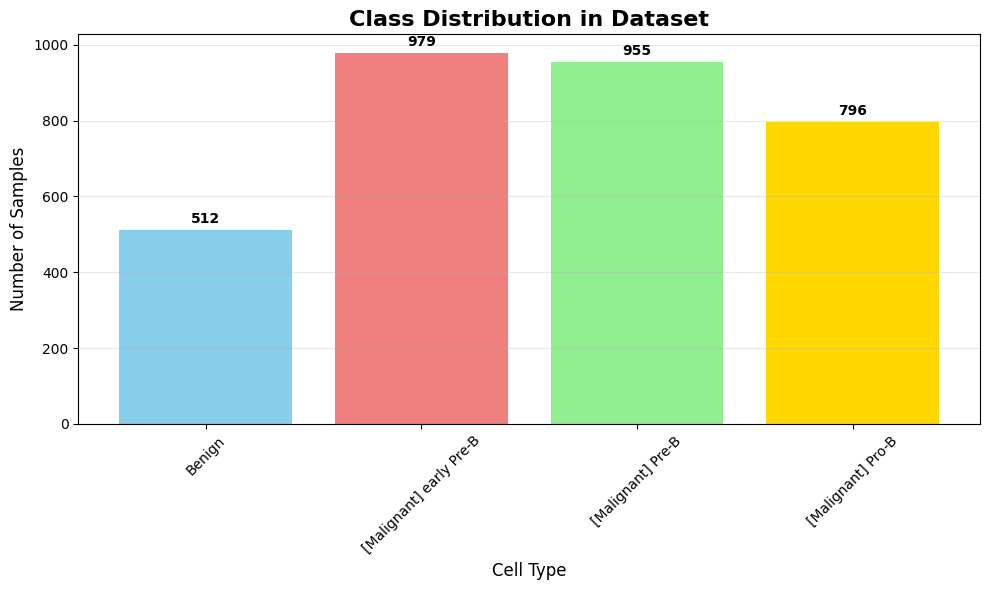

In [3]:
# Check if data directory exists
if not os.path.exists(CONFIG['data_dir']):
    print(f"Error: Data directory '{CONFIG['data_dir']}' not found!")
    print("Please make sure the data is in the correct location.")
else:
    print(f"Data directory found: {CONFIG['data_dir']}")
    
    # List subdirectories
    subdirs = [d for d in os.listdir(CONFIG['data_dir']) 
               if os.path.isdir(os.path.join(CONFIG['data_dir'], d))]
    print(f"\nSubdirectories found: {subdirs}")
    
    # Count samples in each class
    from imutils import paths
    
    total_samples = len(list(paths.list_images(CONFIG['data_dir'])))
    print(f"\nTotal samples in dataset: {total_samples}")
    
    print("\nSamples per class:")
    class_counts = {}
    for subdir in subdirs:
        class_path = os.path.join(CONFIG['data_dir'], subdir)
        count = len(list(paths.list_images(class_path)))
        class_counts[subdir] = count
        print(f"  {subdir}: {count} samples")
    
    # Visualize class distribution
    plt.figure(figsize=(10, 6))
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    
    colors = ['skyblue', 'lightcoral', 'lightgreen', 'gold']
    bars = plt.bar(classes, counts, color=colors[:len(classes)])
    
    plt.title('Class Distribution in Dataset', fontsize=16, fontweight='bold')
    plt.xlabel('Cell Type', fontsize=12)
    plt.ylabel('Number of Samples', fontsize=12)
    plt.xticks(rotation=45)
    
    # Add count labels on bars
    for bar, count in zip(bars, counts):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 10,
                str(count), ha='center', va='bottom', fontweight='bold')
    
    plt.tight_layout()
    plt.grid(axis='y', alpha=0.3)
    plt.show()

## 4. Data Preprocessing

### 4.1 Create Temporary Folders and Split Data

Create organized folder structure for processed data and split the original dataset into training and testing sets.

In [4]:
# Create temporary folders for processed data (Skip if already exists)
if not os.path.exists(CONFIG['temp_data_dir']) or len(os.listdir(CONFIG['temp_data_dir'])) == 0:
    print("📁 Creating temporary folders for processed data...")
    create_temp_folders(CONFIG['temp_data_dir'])
    
    # Split data into training and testing
    print("📂 Splitting data into training and testing sets...")
    train_list, test_list = prepare_data_splits(
        CONFIG['data_dir'], 
        train_ratio=CONFIG['train_split'], 
        random_seed=CONFIG['random_seed']
    )
    print(f"✅ Data split completed: {len(train_list)} training, {len(test_list)} testing samples")
else:
    print("⏭️  Skipping data splitting - temporary folders already exist")
    # Still need to get the lists for further processing
    train_list, test_list = prepare_data_splits(
        CONFIG['data_dir'], 
        train_ratio=CONFIG['train_split'], 
        random_seed=CONFIG['random_seed']
    )

⏭️  Skipping data splitting - temporary folders already exist
Number of training samples: 2917
Number of testing samples: 325


### 4.2 Process and Save Test Data

Process test data by resizing images to standard dimensions without augmentation to maintain evaluation consistency.

In [5]:
# Process and save test data (no augmentation) - Skip if already processed
test_output_dir = os.path.join(CONFIG['temp_data_dir'], 'prepared_test')

# Check if test data is already processed
test_already_processed = False
if os.path.exists(test_output_dir):
    # Count existing test files for verification
    try:
        test_count = sum([len(os.listdir(os.path.join(test_output_dir, d))) 
                         for d in os.listdir(test_output_dir) 
                         if os.path.isdir(os.path.join(test_output_dir, d))])
        if test_count > 0:
            test_already_processed = True
    except:
        test_count = 0

if not test_already_processed:
    print("🧪 Processing and saving test data...")
    process_and_save_test_data(test_list, test_output_dir)
    print("✅ Test data processing completed")
    
    # Count processed files after completion
    test_count = sum([len(os.listdir(os.path.join(test_output_dir, d))) 
                     for d in os.listdir(test_output_dir) 
                     if os.path.isdir(os.path.join(test_output_dir, d))])
    print(f"📊 Processed {test_count} test samples")
else:
    print("⏭️  Skipping test data processing - already completed")
    print(f"📊 Found {test_count} processed test samples")

⏭️  Skipping test data processing - already completed
📊 Found 325 processed test samples


### 4.3 Process and Save Training Data with Segmentation

Process training data by applying K-means clustering based segmentation. Each original sample creates two samples:
1. **Original resized image**: For learning general features
2. **Segmented image**: For focusing on cell-specific features

This doubles the training data size and helps the model learn both global and local features.

In [6]:
# Process and save training data with segmentation augmentation - Skip if already processed
train_output_dir = os.path.join(CONFIG['temp_data_dir'], 'prepared_data')

# Check if training data is already processed
train_already_processed = False
if os.path.exists(train_output_dir):
    # Count existing training files for verification
    try:
        train_count = sum([len(os.listdir(os.path.join(train_output_dir, d))) 
                          for d in os.listdir(train_output_dir) 
                          if os.path.isdir(os.path.join(train_output_dir, d))])
        if train_count > 0:
            train_already_processed = True
    except:
        train_count = 0

if not train_already_processed:
    print("🔄 Processing and saving training data with segmentation augmentation...")
    print("⏳ This may take several minutes as it includes K-means segmentation...")
    process_and_save_train_data_with_segmentation(train_list, train_output_dir)
    print("✅ Training data processing with segmentation completed")
    
    # Count processed files after completion
    train_count = sum([len(os.listdir(os.path.join(train_output_dir, d))) 
                      for d in os.listdir(train_output_dir) 
                      if os.path.isdir(os.path.join(train_output_dir, d))])
    print(f"📊 Processed {train_count} training samples (including augmented data)")
else:
    print("⏭️  Skipping training data processing - already completed")
    print(f"📊 Found {train_count} processed training samples (including augmented data)")

⏭️  Skipping training data processing - already completed
📊 Found 5834 processed training samples (including augmented data)


### 4.4 Create DataFrames and Data Generators

Create pandas DataFrames from processed data and set up Keras data generators with appropriate augmentation strategies.

In [7]:
# Create DataFrames from processed data
train_df, test_df = create_dataframes(
    train_dir=train_output_dir,
    test_dir=test_output_dir,
    random_seed=CONFIG['random_seed']
)

# Split training data into train and validation
train_final_df, valid_df = train_test_split(
    train_df, 
    train_size=CONFIG['val_split'], 
    shuffle=True, 
    random_state=CONFIG['random_seed']
)

print(f"Final training samples: {len(train_final_df)}")
print(f"Validation samples: {len(valid_df)}")
print(f"Test samples: {len(test_df)}")

DataFrames created successfully!
Training samples: 5834
Test samples: 325

Class distribution in training data:
EarlyPreB    1764
PreB         1710
ProB         1456
benign        904
Name: labels, dtype: int64
Final training samples: 4667
Validation samples: 1167
Test samples: 325


In [8]:
# Create data generators
train_gen, valid_gen, test_gen = create_data_generators(
    train_final_df, 
    valid_df, 
    test_df,
    batch_size=CONFIG['batch_size'],
    img_size=CONFIG['img_size']
)

print(f"Training batches per epoch: {len(train_gen)}")
print(f"Validation batches per epoch: {len(valid_gen)}")
print(f"Test batches: {len(test_gen)}")

Found 4667 validated image filenames belonging to 4 classes.
Found 1167 validated image filenames belonging to 4 classes.
Found 325 validated image filenames belonging to 4 classes.
Training batches per epoch: 146
Validation batches per epoch: 37
Test batches: 1


### 4.5 Visualize Sample Training Data

Display sample training images to verify data preprocessing and augmentation.

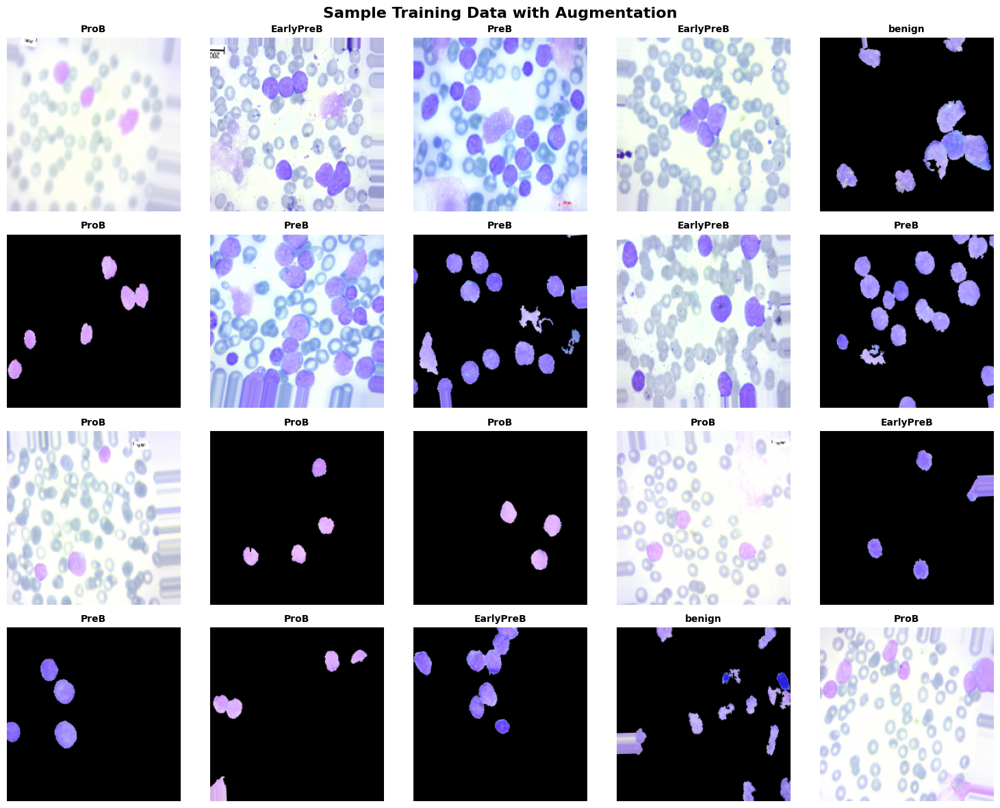

In [9]:
# Visualize sample training data
def plot_sample_batch(generator, title="Sample Training Data"):
    """Plot a sample batch from data generator"""
    images, labels = next(generator)
    class_names = list(generator.class_indices.keys())
    
    plt.figure(figsize=(15, 12))
    for i in range(min(20, len(images))):
        plt.subplot(4, 5, i + 1)
        plt.imshow(images[i])
        
        # Get class name
        class_idx = np.argmax(labels[i])
        class_name = class_names[class_idx]
        
        plt.title(f'{class_name}', fontsize=10, fontweight='bold')
        plt.axis('off')
    
    plt.suptitle(title, fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

plot_sample_batch(train_gen, "Sample Training Data with Augmentation")

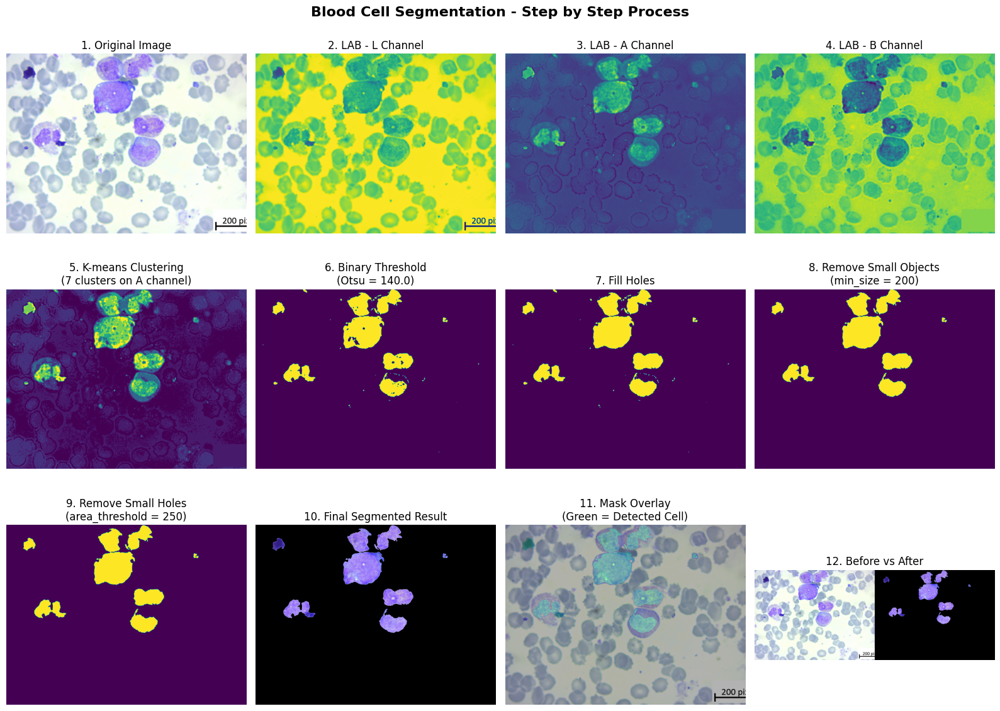


🎯 Otsu Threshold Analysis:
   Optimal threshold value: 140.0
   This value was automatically calculated based on histogram analysis
   to minimize intra-class variance between foreground and background.


In [12]:
image_path = "data\Blood cell Cancer [ALL]\Benign\Snap_176.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
segmented = segment_blood_cell(image, visualize=True)

## 5. Model Creation

### 5.1 MobileNetV2 Baseline Model

Create the baseline model using MobileNetV2 architecture - an efficient model designed for mobile applications with excellent accuracy-to-efficiency trade-off.

In [10]:
# Create MobileNetV2 baseline model
baseline_model = create_mobilenetv2_baseline(
    input_shape=CONFIG['img_shape'],
    num_classes=CONFIG['num_classes'],
    dropout_rate=CONFIG['dropout_rate']
)

# Compile the model
baseline_model = compile_model(
    baseline_model,
    initial_learning_rate=CONFIG['initial_lr'],
    decay_steps=CONFIG['lr_decay_steps'],
    decay_rate=CONFIG['lr_decay_rate']
)

print("MobileNetV2 Baseline Model created and compiled!")
print(f"Total parameters: {baseline_model.count_params():,}")

# Optional: Display model summary
baseline_model.summary()

MobileNetV2 Baseline Model created and compiled!
Total parameters: 2,268,228
Model: "MobileNetV3Small_Baseline"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                

### 5.2 MobileNetV2 + CBAM Model

Create the CBAM-enhanced model. CBAM (Convolutional Block Attention Module) adds attention mechanisms that help the model focus on important spatial and channel features, potentially improving classification accuracy.

In [11]:
# Create MobileNetV2 + CBAM model
cbam_model = create_simple_mobilenetv2_cbam(
    input_shape=CONFIG['img_shape'],
    num_classes=CONFIG['num_classes'],
    dropout_rate=CONFIG['dropout_rate']
)

# Compile the model
cbam_model = compile_model(
    cbam_model,
    initial_learning_rate=CONFIG['initial_lr'],
    decay_steps=CONFIG['lr_decay_steps'],
    decay_rate=CONFIG['lr_decay_rate']
)

print("MobileNetV2 + CBAM Model created and compiled!")
print(f"Total parameters: {cbam_model.count_params():,}")

# Optional: Display model summary
cbam_model.summary()

MobileNetV2 + CBAM Model created and compiled!
Total parameters: 2,839,238
Model: "MobileNetV3Small_Small_Simple_CBAM"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']         

## 6. Model Training

### 6.1 Setup Training Callbacks

Configure callbacks for better training control and model optimization.

In [ ]:
# Setup training callbacks
def create_callbacks(model_name):
    """Create training callbacks for model optimization"""
    # Create models directory if it doesn't exist
    os.makedirs(CONFIG['models_dir'], exist_ok=True)
    
    callbacks = [
        EarlyStopping(
            monitor='val_loss',
            patience=7,
            restore_best_weights=True,
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.1618,
            patience=1,
            min_lr=1e-8,
            verbose=1
        ),

        ModelCheckpoint(
            filepath=os.path.join(CONFIG['models_dir'], f'{model_name}_best.h5'),
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        )
    ]
    return callbacks

print("Training callbacks configured!")

Training callbacks configured!


### 6.2 Train MobileNetV2 Baseline Model

Train the baseline model to establish performance benchmarks.

In [13]:
# Train baseline model
print("Training MobileNetV2 Baseline Model...")
print("=" * 50)

baseline_callbacks = create_callbacks('mobilenetv2_baseline')

baseline_history = baseline_model.fit(
    train_gen,
    epochs=CONFIG['epochs'],
    validation_data=valid_gen,
    callbacks=baseline_callbacks,
    verbose=CONFIG['verbose']
)

print("\nBaseline model training completed!")

Training MobileNetV2 Baseline Model...
Epoch 1/50
146/146 [==============================] - ETA: 0s - loss: 0.3636 - accuracy: 0.8864
Epoch 1: val_accuracy improved from -inf to 0.66067, saving model to models\mobilenetv2_baseline_best.h5
146/146 [==============================] - 40s 245ms/step - loss: 0.3636 - accuracy: 0.8864 - val_loss: 1.9432 - val_accuracy: 0.6607 - lr: 0.0010
Epoch 2/50
146/146 [==============================] - ETA: 0s - loss: 0.1803 - accuracy: 0.9400
Epoch 2: ReduceLROnPlateau reducing learning rate to 0.00016180000768508762.

Epoch 2: val_accuracy did not improve from 0.66067
146/146 [==============================] - 35s 235ms/step - loss: 0.1803 - accuracy: 0.9400 - val_loss: 13.8617 - val_accuracy: 0.2956 - lr: 0.0010
Epoch 3/50
146/146 [==============================] - ETA: 0s - loss: 0.1124 - accuracy: 0.9625
Epoch 3: ReduceLROnPlateau reducing learning rate to 2.6179241563659163e-05.

Epoch 3: val_accuracy did not improve from 0.66067
146/146 [======

### 6.3 Train MobileNetV2 + CBAM Model

Train the CBAM-enhanced model to evaluate the impact of attention mechanisms.

In [14]:
# Train CBAM model
print("Training MobileNetV2 + CBAM Model...")
print("=" * 50)

cbam_callbacks = create_callbacks('mobilenetv2_cbam')

cbam_history = cbam_model.fit(
    train_gen,
    epochs=CONFIG['epochs'],
    validation_data=valid_gen,
    callbacks=cbam_callbacks,
    verbose=CONFIG['verbose']
)

print("\nCBAM model training completed!")

Training MobileNetV2 + CBAM Model...
Epoch 1/50
146/146 [==============================] - ETA: 0s - loss: 0.3877 - accuracy: 0.8642
Epoch 1: val_accuracy improved from -inf to 0.40360, saving model to models\mobilenetv2_cbam_best.h5
146/146 [==============================] - 49s 297ms/step - loss: 0.3877 - accuracy: 0.8642 - val_loss: 4.9795 - val_accuracy: 0.4036 - lr: 0.0010
Epoch 2/50
146/146 [==============================] - ETA: 0s - loss: 0.2246 - accuracy: 0.9231
Epoch 2: ReduceLROnPlateau reducing learning rate to 0.00016180000768508762.

Epoch 2: val_accuracy improved from 0.40360 to 0.43273, saving model to models\mobilenetv2_cbam_best.h5
146/146 [==============================] - 43s 291ms/step - loss: 0.2246 - accuracy: 0.9231 - val_loss: 5.4735 - val_accuracy: 0.4327 - lr: 0.0010
Epoch 3/50
146/146 [==============================] - ETA: 0s - loss: 0.1114 - accuracy: 0.9655
Epoch 3: val_accuracy improved from 0.43273 to 0.44901, saving model to models\mobilenetv2_cbam_be

## 7. Training Analysis

### 7.1 Visualize Training History

Analyze training and validation curves to understand model behavior and detect overfitting.

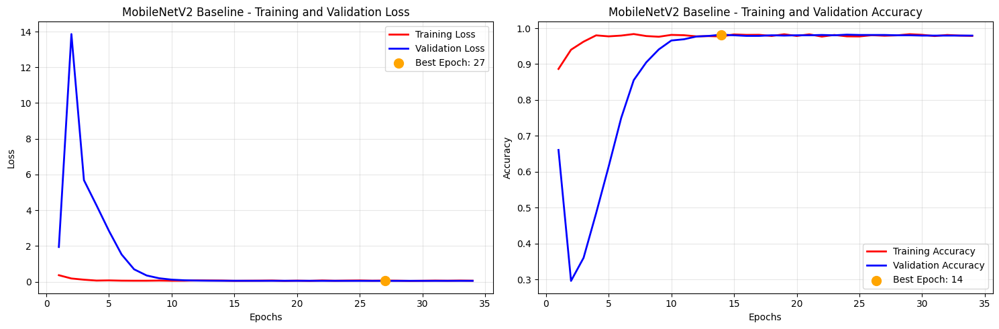

In [15]:
# Plot training history for baseline model
plot_training_history(
    baseline_history, 
    model_name="MobileNetV2 Baseline",
    save_path=CONFIG['results_dir']
)

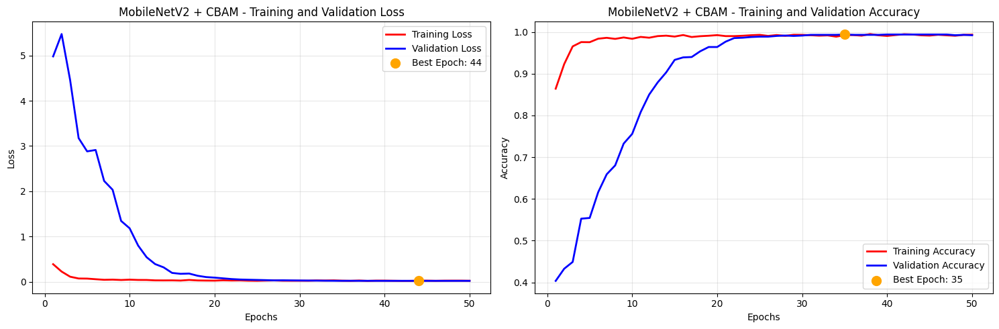

In [16]:
# Plot training history for CBAM model
plot_training_history(
    cbam_history, 
    model_name="MobileNetV2 + CBAM",
    save_path=CONFIG['results_dir']
)

## 8. Model Evaluation

### 8.1 Evaluate Both Models on Test Data

Comprehensive evaluation of both models using various metrics to understand their performance.

In [17]:
# Evaluate baseline model
baseline_results = evaluate_model(
    baseline_model, 
    test_gen, 
    model_name="MobileNetV2 Baseline"
)

# Evaluate CBAM model
cbam_results = evaluate_model(
    cbam_model, 
    test_gen, 
    model_name="MobileNetV2 + CBAM"
)

Evaluating MobileNetV2 Baseline...
MobileNetV2 Baseline Test Results:
  Accuracy: 0.9908
  Loss: 0.0389
  MAE: 0.0154
Evaluating MobileNetV2 + CBAM...
MobileNetV2 + CBAM Test Results:
  Accuracy: 0.9969
  Loss: 0.0217
  MAE: 0.0031


### 8.2 Confusion Matrices

Visualize model performance through confusion matrices to understand classification patterns and potential misclassifications.

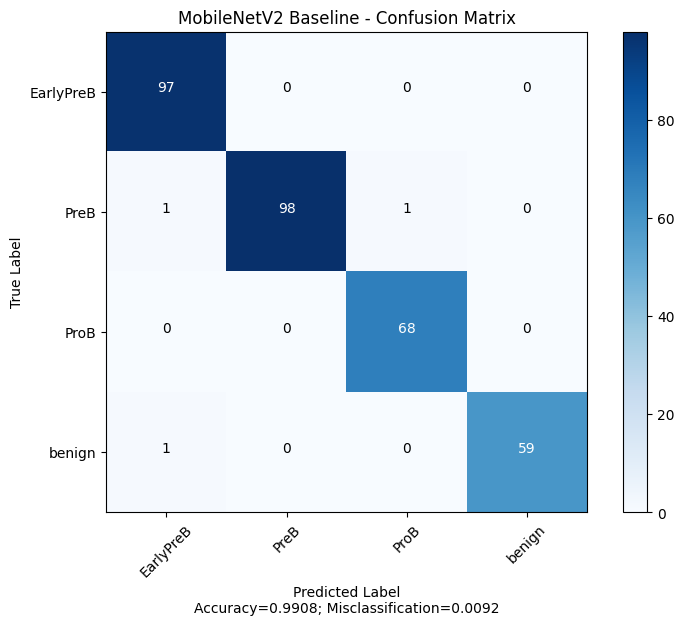

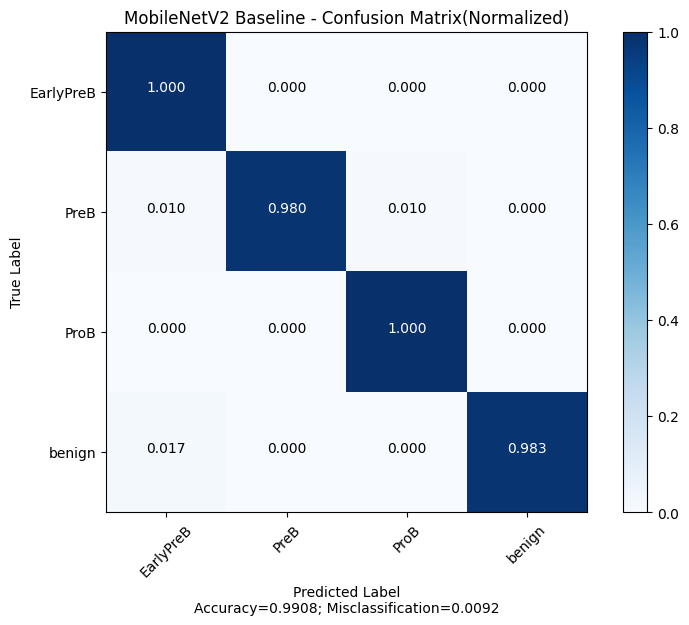

In [18]:
# Plot confusion matrices for baseline model
plot_confusion_matrix(
    baseline_results['true_classes'],
    baseline_results['predicted_classes'],
    CONFIG['class_names'],
    model_name="MobileNetV2 Baseline",
    normalize=False,
    save_path=CONFIG['results_dir']
)

plot_confusion_matrix(
    baseline_results['true_classes'],
    baseline_results['predicted_classes'],
    CONFIG['class_names'],
    model_name="MobileNetV2 Baseline",
    normalize=True,
    save_path=CONFIG['results_dir']
)

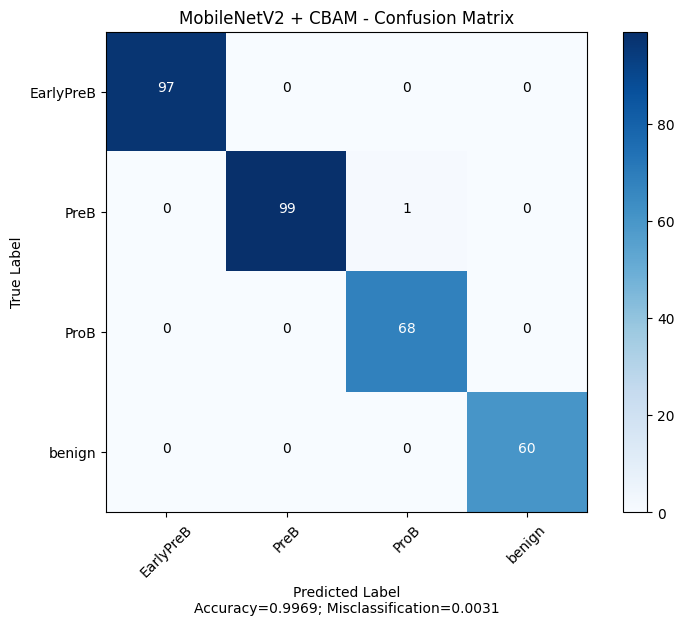

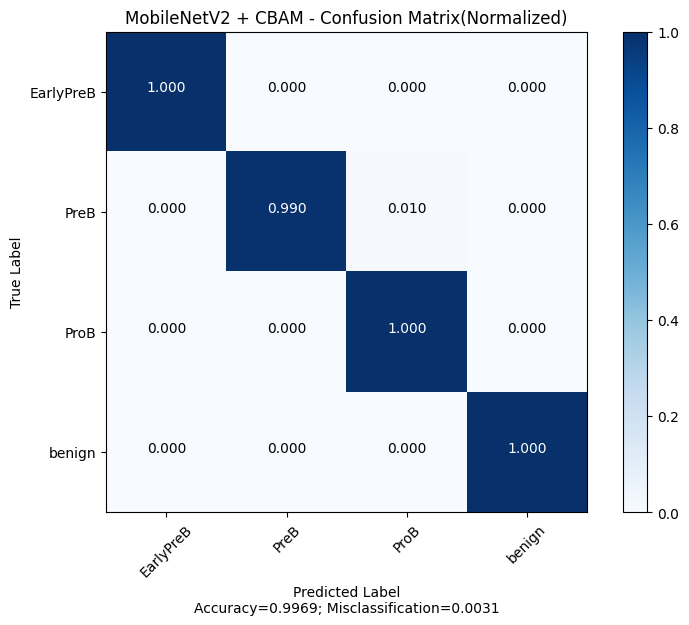

In [19]:
# Plot confusion matrices for CBAM model
plot_confusion_matrix(
    cbam_results['true_classes'],
    cbam_results['predicted_classes'],
    CONFIG['class_names'],
    model_name="MobileNetV2 + CBAM",
    normalize=False,
    save_path=CONFIG['results_dir']
)

plot_confusion_matrix(
    cbam_results['true_classes'],
    cbam_results['predicted_classes'],
    CONFIG['class_names'],
    model_name="MobileNetV2 + CBAM",
    normalize=True,
    save_path=CONFIG['results_dir']
)

### 8.3 Detailed Classification Reports

Generate comprehensive classification reports with precision, recall, F1-score, and other metrics for each class.

In [20]:
# Print detailed classification reports
print_classification_report(
    baseline_results['true_classes'],
    baseline_results['predicted_classes'],
    CONFIG['class_names'],
    model_name="MobileNetV2 Baseline"
)


MobileNetV2 Baseline - Detailed Classification Report:
              precision    recall  f1-score   support

   EarlyPreB       0.98      1.00      0.99        97
        PreB       1.00      0.98      0.99       100
        ProB       0.99      1.00      0.99        68
      benign       1.00      0.98      0.99        60

    accuracy                           0.99       325
   macro avg       0.99      0.99      0.99       325
weighted avg       0.99      0.99      0.99       325


Detailed Metrics per Class:
------------------------------------------------------------
EarlyPreB:
  Accuracy: 0.9938
  Precision: 0.9798
  Recall (Sensitivity): 1.0000
  Specificity: 0.9912
  F1-Score: 0.9898

PreB:
  Accuracy: 0.9938
  Precision: 1.0000
  Recall (Sensitivity): 0.9800
  Specificity: 1.0000
  F1-Score: 0.9899

ProB:
  Accuracy: 0.9969
  Precision: 0.9855
  Recall (Sensitivity): 1.0000
  Specificity: 0.9961
  F1-Score: 0.9927

benign:
  Accuracy: 0.9969
  Precision: 1.0000
  Recall (Sen

In [21]:
print_classification_report(
    cbam_results['true_classes'],
    cbam_results['predicted_classes'],
    CONFIG['class_names'],
    model_name="MobileNetV2 + CBAM"
)


MobileNetV2 + CBAM - Detailed Classification Report:
              precision    recall  f1-score   support

   EarlyPreB       1.00      1.00      1.00        97
        PreB       1.00      0.99      0.99       100
        ProB       0.99      1.00      0.99        68
      benign       1.00      1.00      1.00        60

    accuracy                           1.00       325
   macro avg       1.00      1.00      1.00       325
weighted avg       1.00      1.00      1.00       325


Detailed Metrics per Class:
------------------------------------------------------------
EarlyPreB:
  Accuracy: 1.0000
  Precision: 1.0000
  Recall (Sensitivity): 1.0000
  Specificity: 1.0000
  F1-Score: 1.0000

PreB:
  Accuracy: 0.9969
  Precision: 1.0000
  Recall (Sensitivity): 0.9900
  Specificity: 1.0000
  F1-Score: 0.9950

ProB:
  Accuracy: 0.9969
  Precision: 0.9855
  Recall (Sensitivity): 1.0000
  Specificity: 0.9961
  F1-Score: 0.9927

benign:
  Accuracy: 1.0000
  Precision: 1.0000
  Recall (Sensi

### 8.4 Sample Predictions Visualization

Visualize sample predictions to understand model behavior and identify potential issues.

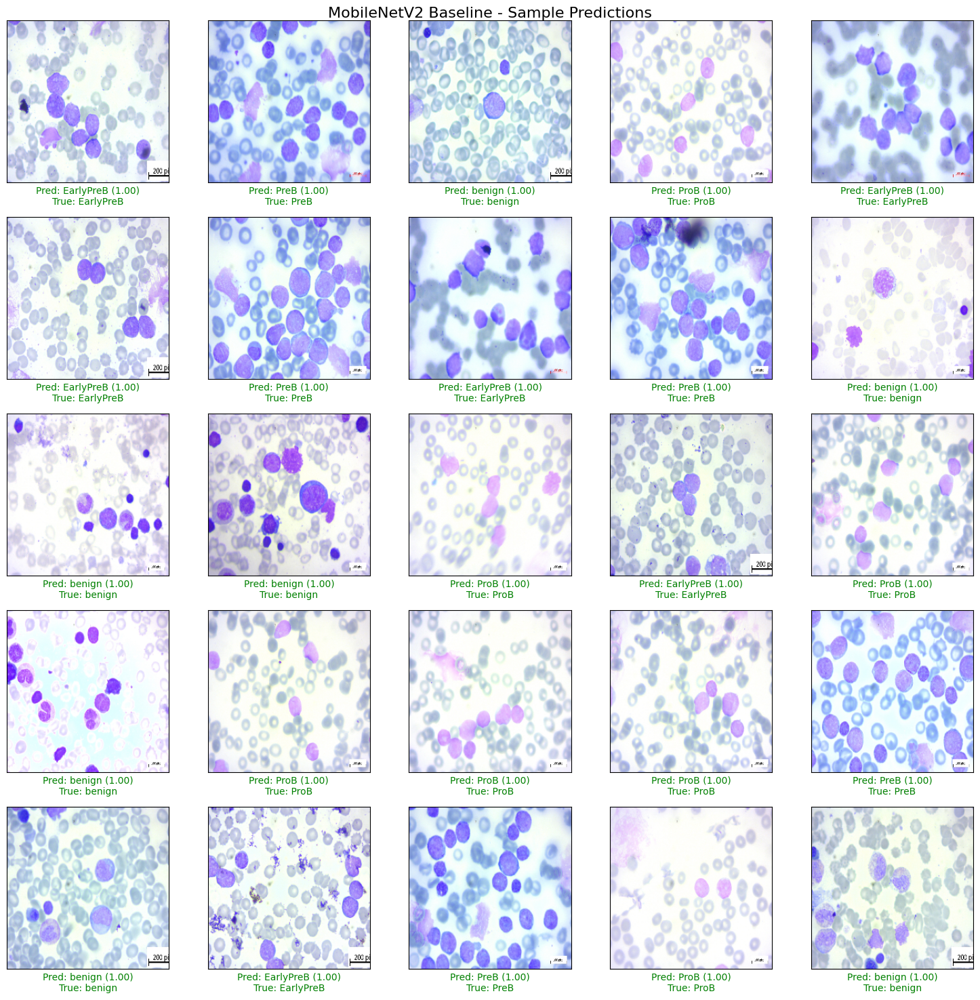

In [22]:
# Plot sample predictions for baseline model
plot_sample_predictions(
    baseline_results['X_test'],
    baseline_results['true_classes'],
    baseline_results['predicted_classes'],
    baseline_results['predictions'],
    CONFIG['class_names'],
    model_name="MobileNetV2 Baseline",
    num_samples=25,
    save_path=CONFIG['results_dir']
)

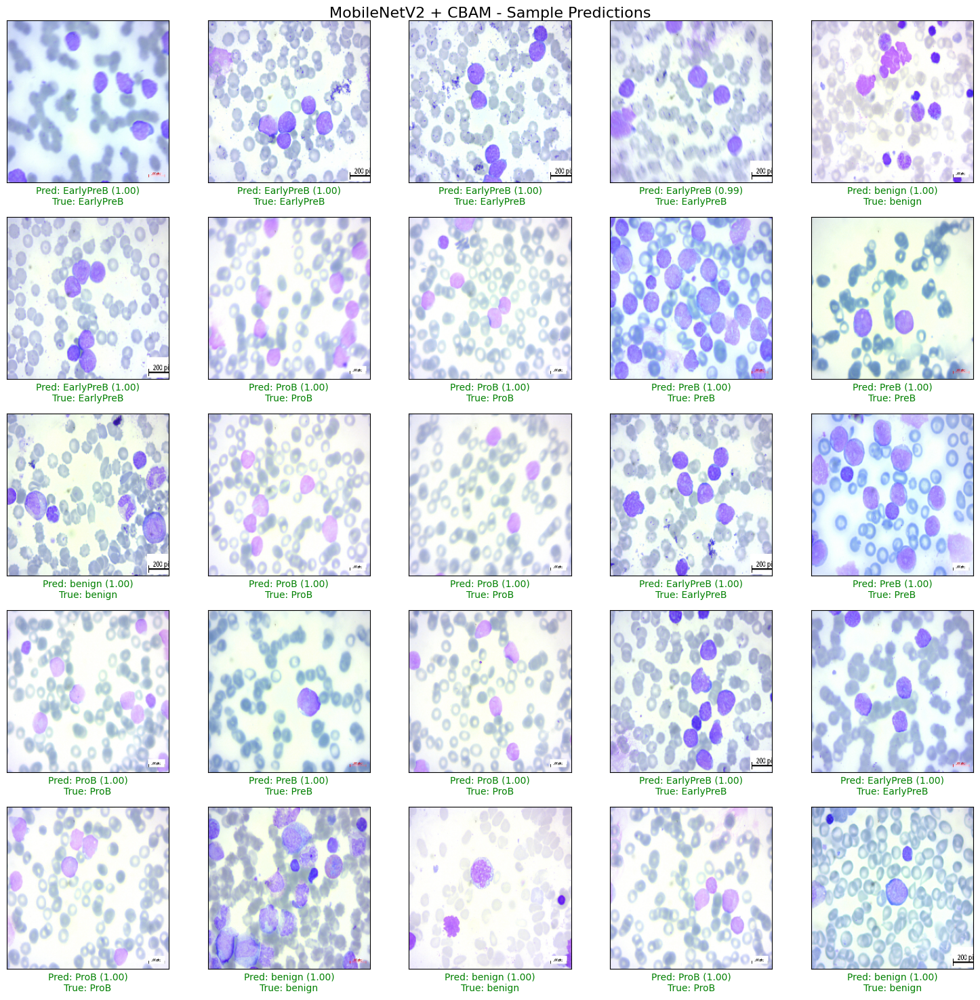

In [23]:
# Plot sample predictions for CBAM model
plot_sample_predictions(
    cbam_results['X_test'],
    cbam_results['true_classes'],
    cbam_results['predicted_classes'],
    cbam_results['predictions'],
    CONFIG['class_names'],
    model_name="MobileNetV2 + CBAM",
    num_samples=25,
    save_path=CONFIG['results_dir']
)

## 9. Model Comparison

### 9.1 Compare Model Performance

Direct comparison of both models to determine which architecture performs better for blood cell classification.

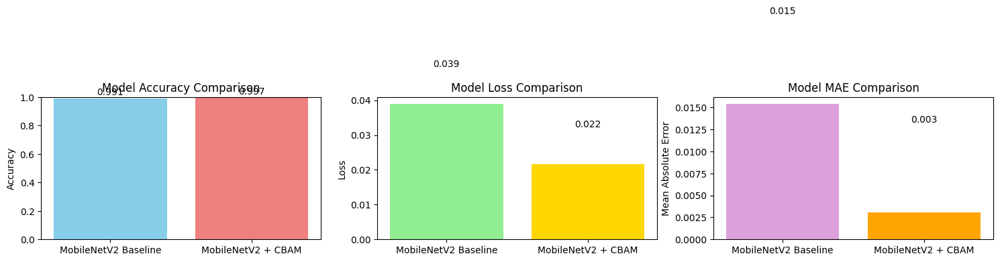


Model Performance Comparison:
MobileNetV2 Baseline:
  Accuracy: 0.9908
  Loss: 0.0389
  MAE: 0.0154

MobileNetV2 + CBAM:
  Accuracy: 0.9969
  Loss: 0.0217
  MAE: 0.0031



In [24]:
# Compare models
model_results = [baseline_results, cbam_results]
model_names = ["MobileNetV2 Baseline", "MobileNetV2 + CBAM"]

comparison_metrics = compare_models(
    model_results,
    model_names,
    CONFIG['class_names'],
    save_path=CONFIG['results_dir']
)

### 9.2 Save Models and Results

Save trained models and evaluation results for future use and deployment.

In [25]:
# Save baseline model and results
save_model_and_results(
    baseline_model,
    baseline_history,
    baseline_results,
    "mobilenetv2_baseline",
    save_dir=CONFIG['results_dir']
)

# Save CBAM model and results
save_model_and_results(
    cbam_model,
    cbam_history,
    cbam_results,
    "mobilenetv2_cbam",
    save_dir=CONFIG['results_dir']
)

Model saved to: results\mobilenetv2_baseline.h5
Training history saved to: results\mobilenetv2_baseline_history.npz
Results saved to: results\mobilenetv2_baseline_results.npz
Model saved to: results\mobilenetv2_cbam.h5
Training history saved to: results\mobilenetv2_cbam_history.npz
Results saved to: results\mobilenetv2_cbam_results.npz


## 10. Summary and Conclusions

### 10.1 Performance Summary

Summarize the key findings and model performance metrics.

In [26]:
# Print final summary
print("=" * 80)
print("BLOOD CELL CLASSIFICATION - FINAL RESULTS SUMMARY")
print("=" * 80)

print(f"\nDataset Information:")
print(f"  - Total samples: {len(train_list) + len(test_list)}")
print(f"  - Training samples (after augmentation): {len(train_final_df)}")
print(f"  - Validation samples: {len(valid_df)}")
print(f"  - Test samples: {len(test_df)}")
print(f"  - Classes: {len(CONFIG['class_names'])} ({', '.join(CONFIG['class_names'])})")

print(f"\nModel Performance Comparison:")
print(f"  MobileNetV2 Baseline:")
print(f"    - Test Accuracy: {baseline_results['test_accuracy']:.4f} ({baseline_results['test_accuracy']*100:.2f}%)")
print(f"    - Test Loss: {baseline_results['test_loss']:.4f}")
print(f"    - Parameters: {baseline_model.count_params():,}")

print(f"  MobileNetV2 + CBAM:")
print(f"    - Test Accuracy: {cbam_results['test_accuracy']:.4f} ({cbam_results['test_accuracy']*100:.2f}%)")
print(f"    - Test Loss: {cbam_results['test_loss']:.4f}")
print(f"    - Parameters: {cbam_model.count_params():,}")

# Determine best model
if cbam_results['test_accuracy'] > baseline_results['test_accuracy']:
    improvement = (cbam_results['test_accuracy'] - baseline_results['test_accuracy']) * 100
    print(f"\n✅ CBAM Enhancement: +{improvement:.2f}% accuracy improvement")
    print(f"   Best Model: MobileNetV2 + CBAM")
else:
    decline = (baseline_results['test_accuracy'] - cbam_results['test_accuracy']) * 100
    print(f"\n❌ CBAM Enhancement: -{decline:.2f}% accuracy decline")
    print(f"   Best Model: MobileNetV2 Baseline")

print(f"\nKey Technical Achievements:")
print(f"  ✓ Implemented K-means clustering segmentation for data augmentation")
print(f"  ✓ Successfully adapted Kaggle code for local environment")
print(f"  ✓ Created modular, reusable code architecture")
print(f"  ✓ Implemented CBAM attention mechanism")
print(f"  ✓ Comprehensive evaluation with multiple metrics")

print(f"\nFiles Generated:")
print(f"  - Models: {CONFIG['results_dir']}/")
print(f"  - Training histories and results")
print(f"  - Visualization plots and confusion matrices")

print("\n" + "=" * 80)
print("PROJECT COMPLETED SUCCESSFULLY!")
print("=" * 80)

BLOOD CELL CLASSIFICATION - FINAL RESULTS SUMMARY

Dataset Information:
  - Total samples: 3242
  - Training samples (after augmentation): 4667
  - Validation samples: 1167
  - Test samples: 325
  - Classes: 4 (EarlyPreB, PreB, ProB, benign)

Model Performance Comparison:
  MobileNetV2 Baseline:
    - Test Accuracy: 0.9908 (99.08%)
    - Test Loss: 0.0389
    - Parameters: 2,268,228
  MobileNetV2 + CBAM:
    - Test Accuracy: 0.9969 (99.69%)
    - Test Loss: 0.0217
    - Parameters: 2,839,238

✅ CBAM Enhancement: +0.62% accuracy improvement
   Best Model: MobileNetV2 + CBAM

Key Technical Achievements:
  ✓ Implemented K-means clustering segmentation for data augmentation
  ✓ Successfully adapted Kaggle code for local environment
  ✓ Created modular, reusable code architecture
  ✓ Implemented CBAM attention mechanism
  ✓ Comprehensive evaluation with multiple metrics

Files Generated:
  - Models: results/
  - Training histories and results
  - Visualization plots and confusion matrices

